In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir("/content/drive/My Drive/datasets")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Importando bibliotecas

In [ ]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torchvision.datasets import CIFAR10
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 7500
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  7500


#Preparando o Ambiente

In [ ]:
# Root
dataroot = "/content/drive/My Drive/datasets/data2"
# Number of workers for dataloader
workers = 2

# Batch size e image size
batch_size = 64
image_size = 64

# Latent vector 
z_dim = 128

# Feature maps
features_generator = 128
features_discriminator = 128

# Numero de epocas
num_epochs = 250

# Learning rate
lr_g = 0.0008
lr_d = 0.0006

# Beta hyperparam (Adam)
beta1 = 0.2
beta2 = 0.999

2278


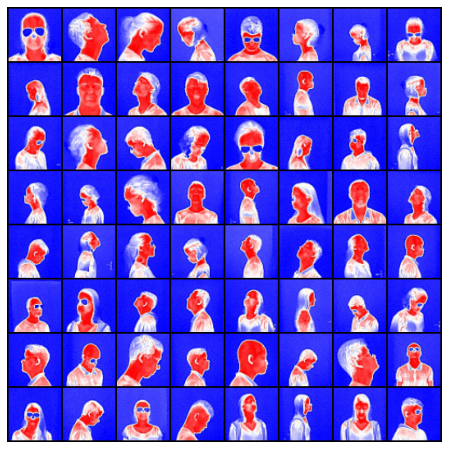

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset e normalizando em [-1,1]
dataset = dset.ImageFolder(dataroot, transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.RandomHorizontalFlip(),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

#verify amount of images loaded
print(len(dataloader.dataset))

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, z_dim,features):
        super(Generator, self).__init__()
        # input is Z, going into a convolution
        self.block1 = self.gen_block(z_dim, features * 8, 4, 1, 0, False)
        # state size. (features*8) x 4 x 4
        self.block2 = self.gen_block(features * 8, features * 4, 4, 2, 1, False)
        # state size. (ngf*4) x 8 x 8
        self.block3 = self.gen_block(features * 4, features * 2, 4, 2, 1, False)
        # state size. (ngf*2) x 16 x 16
        self.block4 = self.gen_block(features * 2, features, 4, 2, 1, False)
        # state size. (ngf) x 32 x 32
        self.block5 = self.gen_block(features, 3, 4, 2, 1, True)

    def gen_block(self, input_channels, output_channels, kernel_size, stride, padding, final=False):
        if not final:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding, bias=False),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.1, inplace=True)
            )
        else: # Final Layer
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding, bias=False),
                nn.Tanh()
            )

    def forward(self, input):
        x = self.block1(input)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)

        return x       

class Discriminator(nn.Module):
    def __init__(self, features):
        super(Discriminator, self).__init__()

        self.block1 = self.gen_block(3, features, 4, 2, 1)
        # state size. (features) x 32 x 32
        self.block2 = self.gen_block(features, features * 2, 4, 2, 1)
        # state size. (features*2) x 16 x 16
        self.block3 = self.gen_block(features * 2, features * 4, 4, 2, 1)
        # state size. (features*4) x 8 x 8
        self.block4 = self.gen_block(features * 4, features * 8, 4, 2, 1)
        # state size. (features*8) x 4 x 4
        self.block5 = self.gen_block(features * 8, 1, 4, 1, 0, True)
        

    def gen_block(self, input_channels, output_channels, kernel_size, stride, padding, final=False):
        if not final:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding, bias=False),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True)
            )
        else: # Final Layer
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding, bias=False),
                nn.Sigmoid()
            )

    def forward(self, input):
        x = self.block1(input)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        return self.block5(x)


In [ ]:
# Create the generator
netG = Generator(z_dim,features_generator).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

# Create the Discriminator
netD = Discriminator(features_discriminator).to(device)
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)


Generator(
  (block1): Sequential(
    (0): ConvTranspose2d(128, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1, inplace=True)
  )
  (block2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1, inplace=True)
  )
  (block3): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1, inplace=True)
  )
  (block4): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_run

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, beta2))
optimizerG = optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, beta2))

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
step = 0

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
noise_eval = torch.randn(batch_size, z_dim, 1, 1, device=device)

load = False

#Load Checkpoint
if os.path.exists(dataroot + "model.pt") and load==True:
  print('Loading model')
  checkpoint = torch.load(dataroot + "model.pt")
  netG.load_state_dict(checkpoint['modelG_state_dict'])
  netD.load_state_dict(checkpoint['modelD_state_dict'])
  optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
  optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
  step = checkpoint['step']
  G_losses = checkpoint['G_losses']
  D_losses = checkpoint['D_losses']
  img_list = checkpoint['img_list']
  noise_eval = checkpoint['noise_eval']

Starting Training Loop...
[0/250]	Loss_D: 1.9153	Loss_G: 23.2296	D(x): 0.4426	D(G(z)): 0.4809 / 0.0000 = 10747.6174


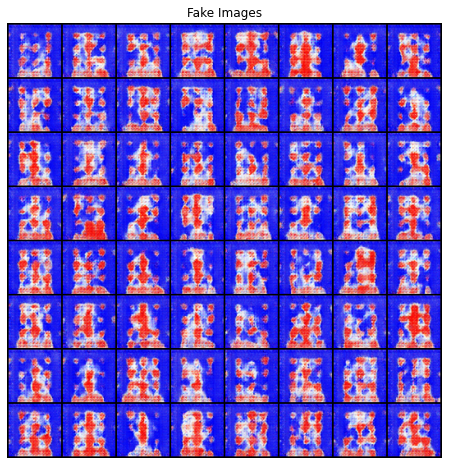

[1/250]	Loss_D: 3.7212	Loss_G: 0.3125	D(x): 0.1170	D(G(z)): 0.0708 / 0.8005 = 0.0885
[2/250]	Loss_D: 1.9953	Loss_G: 0.4308	D(x): 0.2923	D(G(z)): 0.2483 / 0.7070 = 0.3512
[3/250]	Loss_D: 2.0970	Loss_G: 0.3465	D(x): 0.2648	D(G(z)): 0.2295 / 0.7328 = 0.3132
[4/250]	Loss_D: 1.6279	Loss_G: 0.4388	D(x): 0.2901	D(G(z)): 0.2317 / 0.6693 = 0.3461
[5/250]	Loss_D: 1.9885	Loss_G: 0.3412	D(x): 0.2201	D(G(z)): 0.1745 / 0.7433 = 0.2347
[6/250]	Loss_D: 2.1483	Loss_G: 2.4183	D(x): 0.8206	D(G(z)): 0.8109 / 0.1677 = 4.8368
[7/250]	Loss_D: 2.3882	Loss_G: 2.7003	D(x): 0.8255	D(G(z)): 0.8375 / 0.0890 = 9.4086
[8/250]	Loss_D: 1.3881	Loss_G: 0.7900	D(x): 0.5347	D(G(z)): 0.5035 / 0.4646 = 1.0838
[9/250]	Loss_D: 1.6104	Loss_G: 1.8387	D(x): 0.7720	D(G(z)): 0.7039 / 0.2002 = 3.5160
[10/250]	Loss_D: 1.8653	Loss_G: 1.4902	D(x): 0.7123	D(G(z)): 0.6683 / 0.2586 = 2.5837
[11/250]	Loss_D: 1.7898	Loss_G: 2.1501	D(x): 0.7055	D(G(z)): 0.7026 / 0.1550 = 4.5317
[12/250]	Loss_D: 1.4572	Loss_G: 1.2705	D(x): 0.5941	D(G(z)): 0.

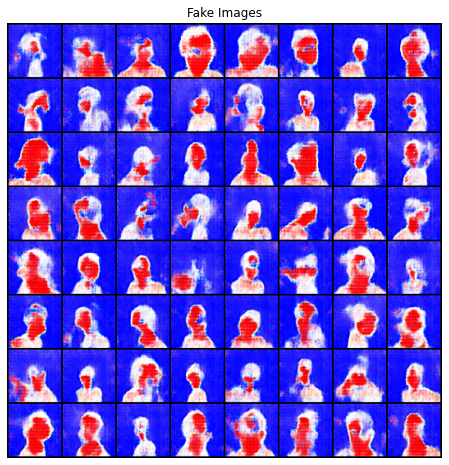

[14/250]	Loss_D: 1.5087	Loss_G: 0.5870	D(x): 0.3705	D(G(z)): 0.3534 / 0.5726 = 0.6173
[15/250]	Loss_D: 1.8110	Loss_G: 0.4825	D(x): 0.3561	D(G(z)): 0.3493 / 0.6507 = 0.5368
[16/250]	Loss_D: 1.9594	Loss_G: 2.2806	D(x): 0.7632	D(G(z)): 0.7489 / 0.1608 = 4.6585
[17/250]	Loss_D: 1.7616	Loss_G: 1.7612	D(x): 0.6455	D(G(z)): 0.6414 / 0.2527 = 2.5387
[18/250]	Loss_D: 1.7579	Loss_G: 1.5506	D(x): 0.6784	D(G(z)): 0.6557 / 0.2640 = 2.4842
[19/250]	Loss_D: 1.5322	Loss_G: 1.5535	D(x): 0.5745	D(G(z)): 0.5552 / 0.2714 = 2.0455
[20/250]	Loss_D: 1.8966	Loss_G: 2.0521	D(x): 0.7651	D(G(z)): 0.7632 / 0.1815 = 4.2059
[21/250]	Loss_D: 1.4587	Loss_G: 1.3000	D(x): 0.5237	D(G(z)): 0.5098 / 0.3366 = 1.5146
[22/250]	Loss_D: 1.8815	Loss_G: 0.6824	D(x): 0.3494	D(G(z)): 0.3794 / 0.5471 = 0.6934
[23/250]	Loss_D: 1.5573	Loss_G: 0.4246	D(x): 0.3191	D(G(z)): 0.2984 / 0.6635 = 0.4496
[24/250]	Loss_D: 1.9181	Loss_G: 0.3538	D(x): 0.2513	D(G(z)): 0.2136 / 0.7152 = 0.2987
[25/250]	Loss_D: 1.4885	Loss_G: 0.6204	D(x): 0.4228	D(

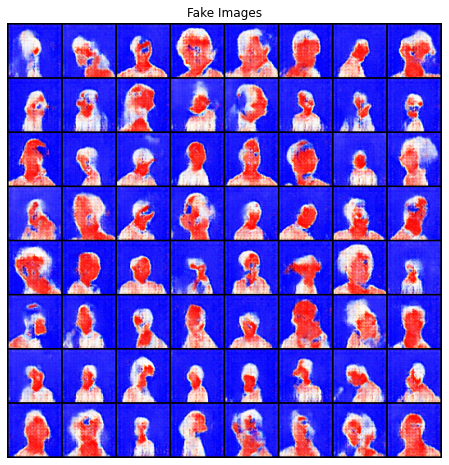

[28/250]	Loss_D: 1.6905	Loss_G: 0.4303	D(x): 0.2670	D(G(z)): 0.2122 / 0.6638 = 0.3196
[29/250]	Loss_D: 1.4726	Loss_G: 0.6416	D(x): 0.3649	D(G(z)): 0.2602 / 0.5542 = 0.4695
[30/250]	Loss_D: 1.5815	Loss_G: 0.7778	D(x): 0.4170	D(G(z)): 0.3683 / 0.4969 = 0.7413
[31/250]	Loss_D: 1.5624	Loss_G: 0.5377	D(x): 0.3830	D(G(z)): 0.3334 / 0.5995 = 0.5562
[32/250]	Loss_D: 1.5961	Loss_G: 1.3182	D(x): 0.5922	D(G(z)): 0.4881 / 0.4103 = 1.1897
[33/250]	Loss_D: 1.4517	Loss_G: 0.7901	D(x): 0.4434	D(G(z)): 0.3800 / 0.4850 = 0.7835
[34/250]	Loss_D: 1.7778	Loss_G: 0.3914	D(x): 0.2604	D(G(z)): 0.2140 / 0.6958 = 0.3075
[35/250]	Loss_D: 1.5207	Loss_G: 1.8139	D(x): 0.6224	D(G(z)): 0.5765 / 0.2147 = 2.6846
[36/250]	Loss_D: 1.4899	Loss_G: 1.6223	D(x): 0.6859	D(G(z)): 0.6295 / 0.2355 = 2.6734
[37/250]	Loss_D: 1.4853	Loss_G: 1.0981	D(x): 0.5486	D(G(z)): 0.4753 / 0.3721 = 1.2774
[38/250]	Loss_D: 2.1370	Loss_G: 2.7492	D(x): 0.7273	D(G(z)): 0.7764 / 0.0902 = 8.6113
[39/250]	Loss_D: 1.7359	Loss_G: 0.9162	D(x): 0.3186	D(

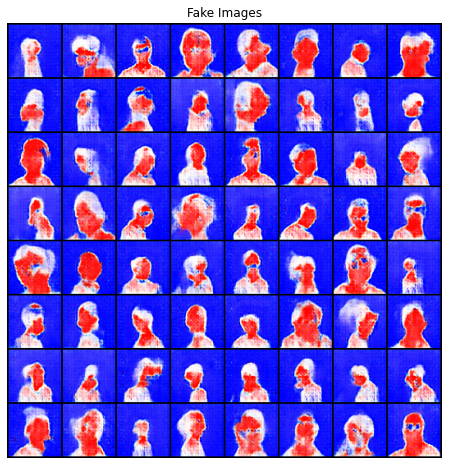

[42/250]	Loss_D: 1.6533	Loss_G: 0.4184	D(x): 0.3270	D(G(z)): 0.2880 / 0.6717 = 0.4288
[43/250]	Loss_D: 1.2976	Loss_G: 0.9730	D(x): 0.5380	D(G(z)): 0.4110 / 0.4082 = 1.0070
[44/250]	Loss_D: 1.2582	Loss_G: 1.1503	D(x): 0.5518	D(G(z)): 0.3798 / 0.3848 = 0.9870
[45/250]	Loss_D: 1.5350	Loss_G: 1.7779	D(x): 0.6239	D(G(z)): 0.5719 / 0.1939 = 2.9498
[46/250]	Loss_D: 2.2677	Loss_G: 0.2663	D(x): 0.1551	D(G(z)): 0.1364 / 0.7788 = 0.1752
[47/250]	Loss_D: 3.4530	Loss_G: 4.2591	D(x): 0.9823	D(G(z)): 0.9331 / 0.0267 = 34.9114
[48/250]	Loss_D: 1.4051	Loss_G: 0.6077	D(x): 0.3931	D(G(z)): 0.2379 / 0.5797 = 0.4104
[49/250]	Loss_D: 1.3872	Loss_G: 1.3479	D(x): 0.5189	D(G(z)): 0.4553 / 0.3249 = 1.4013
[50/250]	Loss_D: 1.5786	Loss_G: 0.4372	D(x): 0.3363	D(G(z)): 0.2204 / 0.6616 = 0.3331
[51/250]	Loss_D: 1.1078	Loss_G: 1.3792	D(x): 0.7173	D(G(z)): 0.4981 / 0.2767 = 1.8004
[52/250]	Loss_D: 1.7662	Loss_G: 0.7464	D(x): 0.2771	D(G(z)): 0.2152 / 0.5092 = 0.4227
[53/250]	Loss_D: 1.4526	Loss_G: 1.4557	D(x): 0.5230	D

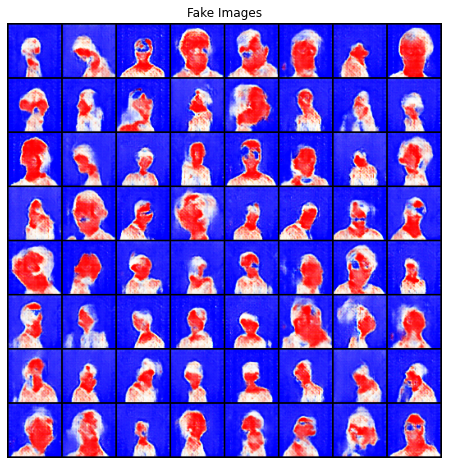

[56/250]	Loss_D: 1.6844	Loss_G: 2.4170	D(x): 0.8900	D(G(z)): 0.7460 / 0.1038 = 7.1852
[57/250]	Loss_D: 1.4370	Loss_G: 2.4811	D(x): 0.7121	D(G(z)): 0.6142 / 0.0919 = 6.6827
[58/250]	Loss_D: 1.1342	Loss_G: 2.2757	D(x): 0.7622	D(G(z)): 0.5127 / 0.1257 = 4.0794
[59/250]	Loss_D: 1.6886	Loss_G: 2.2075	D(x): 0.7852	D(G(z)): 0.7185 / 0.1351 = 5.3190
[60/250]	Loss_D: 1.3647	Loss_G: 1.4013	D(x): 0.6570	D(G(z)): 0.5718 / 0.2953 = 1.9363
[61/250]	Loss_D: 1.4819	Loss_G: 2.3523	D(x): 0.7374	D(G(z)): 0.6047 / 0.1248 = 4.8436
[62/250]	Loss_D: 1.1971	Loss_G: 1.5399	D(x): 0.5856	D(G(z)): 0.4377 / 0.2752 = 1.5903
[63/250]	Loss_D: 2.3275	Loss_G: 0.6695	D(x): 0.1473	D(G(z)): 0.1134 / 0.5545 = 0.2046
[64/250]	Loss_D: 0.8197	Loss_G: 1.7499	D(x): 0.6919	D(G(z)): 0.3234 / 0.2077 = 1.5575
[65/250]	Loss_D: 0.9066	Loss_G: 1.5814	D(x): 0.6780	D(G(z)): 0.2938 / 0.2737 = 1.0734
[66/250]	Loss_D: 1.5365	Loss_G: 2.6627	D(x): 0.8773	D(G(z)): 0.7149 / 0.0868 = 8.2373
[67/250]	Loss_D: 1.5609	Loss_G: 1.2639	D(x): 0.4171	D(

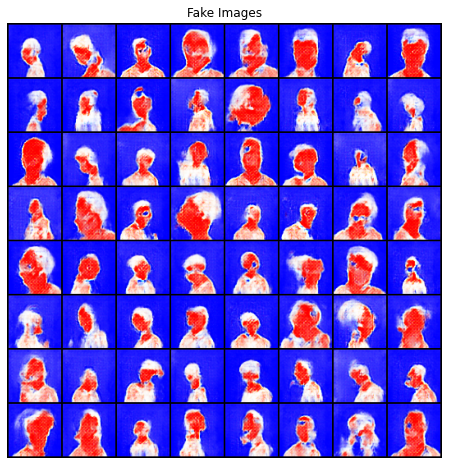

[70/250]	Loss_D: 1.7263	Loss_G: 0.8059	D(x): 0.2912	D(G(z)): 0.1415 / 0.4864 = 0.2908
[71/250]	Loss_D: 1.4249	Loss_G: 2.6203	D(x): 0.9037	D(G(z)): 0.7004 / 0.0979 = 7.1560
[72/250]	Loss_D: 1.3959	Loss_G: 2.6432	D(x): 0.7634	D(G(z)): 0.6126 / 0.0875 = 6.9997
[73/250]	Loss_D: 1.4665	Loss_G: 1.1589	D(x): 0.3943	D(G(z)): 0.2125 / 0.3649 = 0.5823
[74/250]	Loss_D: 1.5190	Loss_G: 1.3738	D(x): 0.3910	D(G(z)): 0.2476 / 0.2913 = 0.8500
[75/250]	Loss_D: 1.9419	Loss_G: 2.2543	D(x): 0.7946	D(G(z)): 0.7538 / 0.1529 = 4.9297
[76/250]	Loss_D: 1.2946	Loss_G: 1.8822	D(x): 0.6044	D(G(z)): 0.4800 / 0.1758 = 2.7297
[77/250]	Loss_D: 1.1066	Loss_G: 1.3613	D(x): 0.7129	D(G(z)): 0.4858 / 0.2953 = 1.6450
[78/250]	Loss_D: 1.3790	Loss_G: 1.8366	D(x): 0.4759	D(G(z)): 0.3627 / 0.1983 = 1.8293
[79/250]	Loss_D: 1.4586	Loss_G: 1.4984	D(x): 0.4669	D(G(z)): 0.3442 / 0.3377 = 1.0192
[80/250]	Loss_D: 1.4274	Loss_G: 2.3435	D(x): 0.8911	D(G(z)): 0.6310 / 0.1165 = 5.4165
[81/250]	Loss_D: 1.2566	Loss_G: 0.9573	D(x): 0.4309	D(

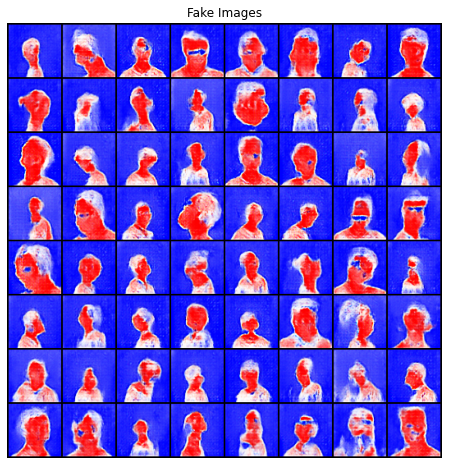

[84/250]	Loss_D: 0.9780	Loss_G: 3.9223	D(x): 0.7911	D(G(z)): 0.4472 / 0.0398 = 11.2216
[85/250]	Loss_D: 1.3916	Loss_G: 4.3667	D(x): 0.8923	D(G(z)): 0.6551 / 0.0193 = 33.9687
[86/250]	Loss_D: 1.5978	Loss_G: 3.2747	D(x): 0.8157	D(G(z)): 0.6867 / 0.0530 = 12.9465
[87/250]	Loss_D: 1.0930	Loss_G: 3.7555	D(x): 0.9002	D(G(z)): 0.5605 / 0.0367 = 15.2777
[88/250]	Loss_D: 1.1109	Loss_G: 1.0101	D(x): 0.4573	D(G(z)): 0.1740 / 0.4304 = 0.4044
[89/250]	Loss_D: 1.7990	Loss_G: 4.1632	D(x): 0.9806	D(G(z)): 0.7293 / 0.0206 = 35.4869
[90/250]	Loss_D: 1.0923	Loss_G: 3.4581	D(x): 0.8500	D(G(z)): 0.5577 / 0.0434 = 12.8427
[91/250]	Loss_D: 0.9363	Loss_G: 3.3777	D(x): 0.8821	D(G(z)): 0.4981 / 0.0458 = 10.8833
[92/250]	Loss_D: 0.5858	Loss_G: 5.1645	D(x): 0.9520	D(G(z)): 0.3680 / 0.0078 = 47.4465
[93/250]	Loss_D: 0.5945	Loss_G: 4.7103	D(x): 0.8969	D(G(z)): 0.3476 / 0.0145 = 24.0325
[94/250]	Loss_D: 1.6560	Loss_G: 1.4264	D(x): 0.2984	D(G(z)): 0.0725 / 0.3039 = 0.2385
[95/250]	Loss_D: 0.9753	Loss_G: 5.4991	D(x): 

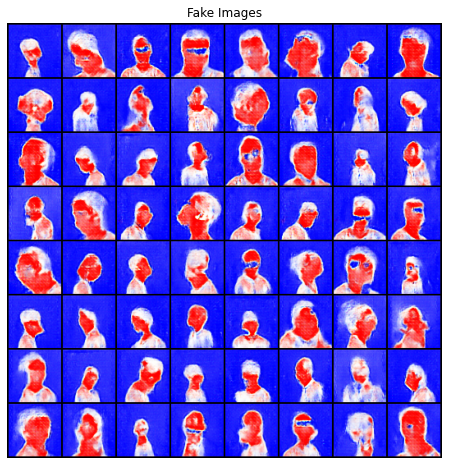

[98/250]	Loss_D: 4.6077	Loss_G: 1.5174	D(x): 0.0472	D(G(z)): 0.0042 / 0.3502 = 0.0119
[99/250]	Loss_D: 1.1110	Loss_G: 2.7404	D(x): 0.5746	D(G(z)): 0.1888 / 0.1266 = 1.4909
[100/250]	Loss_D: 1.1052	Loss_G: 5.7190	D(x): 0.9220	D(G(z)): 0.5717 / 0.0043 = 134.0441
[101/250]	Loss_D: 1.5265	Loss_G: 4.8218	D(x): 0.9562	D(G(z)): 0.6657 / 0.0147 = 45.3216
[102/250]	Loss_D: 1.1155	Loss_G: 2.4937	D(x): 0.6959	D(G(z)): 0.4452 / 0.1331 = 3.3463
[103/250]	Loss_D: 0.5075	Loss_G: 2.6909	D(x): 0.6831	D(G(z)): 0.0409 / 0.1121 = 0.3651
[104/250]	Loss_D: 1.3633	Loss_G: 1.3746	D(x): 0.3520	D(G(z)): 0.0621 / 0.3347 = 0.1855
[105/250]	Loss_D: 1.0721	Loss_G: 4.5587	D(x): 0.9064	D(G(z)): 0.5142 / 0.0223 = 23.0211
[106/250]	Loss_D: 1.0494	Loss_G: 1.0679	D(x): 0.4955	D(G(z)): 0.1655 / 0.4285 = 0.3861
[107/250]	Loss_D: 1.0463	Loss_G: 3.2329	D(x): 0.9053	D(G(z)): 0.5081 / 0.0591 = 8.5941
[108/250]	Loss_D: 0.7842	Loss_G: 1.7510	D(x): 0.6424	D(G(z)): 0.1989 / 0.2406 = 0.8266
[109/250]	Loss_D: 0.8708	Loss_G: 3.1761	D

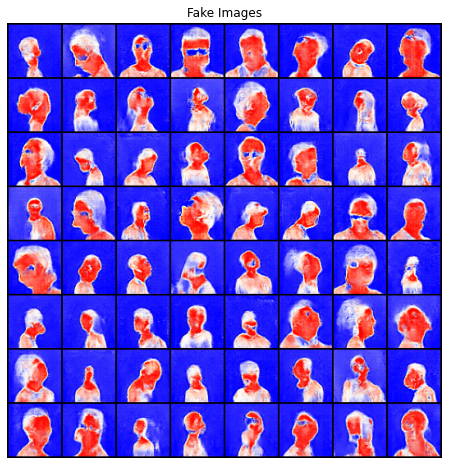

[112/250]	Loss_D: 3.2458	Loss_G: 1.5801	D(x): 0.0813	D(G(z)): 0.0030 / 0.2990 = 0.0100
[113/250]	Loss_D: 1.0015	Loss_G: 5.3441	D(x): 0.9700	D(G(z)): 0.5428 / 0.0081 = 67.3005
[114/250]	Loss_D: 0.7683	Loss_G: 6.1406	D(x): 0.9329	D(G(z)): 0.3906 / 0.0049 = 79.9134
[115/250]	Loss_D: 1.1290	Loss_G: 4.6128	D(x): 0.9578	D(G(z)): 0.5018 / 0.0163 = 30.7834
[116/250]	Loss_D: 1.4774	Loss_G: 2.2036	D(x): 0.3919	D(G(z)): 0.0316 / 0.1965 = 0.1606
[117/250]	Loss_D: 0.6322	Loss_G: 2.0448	D(x): 0.7555	D(G(z)): 0.2193 / 0.1644 = 1.3339
[118/250]	Loss_D: 1.0843	Loss_G: 1.5317	D(x): 0.4991	D(G(z)): 0.1009 / 0.2979 = 0.3385
[119/250]	Loss_D: 0.0998	Loss_G: 4.5054	D(x): 0.9586	D(G(z)): 0.0459 / 0.0201 = 2.2882
[120/250]	Loss_D: 0.8526	Loss_G: 3.1542	D(x): 0.8093	D(G(z)): 0.3355 / 0.0547 = 6.1369
[121/250]	Loss_D: 0.4573	Loss_G: 3.0281	D(x): 0.7790	D(G(z)): 0.0777 / 0.0846 = 0.9188
[122/250]	Loss_D: 0.5917	Loss_G: 2.0219	D(x): 0.7162	D(G(z)): 0.0997 / 0.2391 = 0.4169
[123/250]	Loss_D: 1.2332	Loss_G: 1.9366	

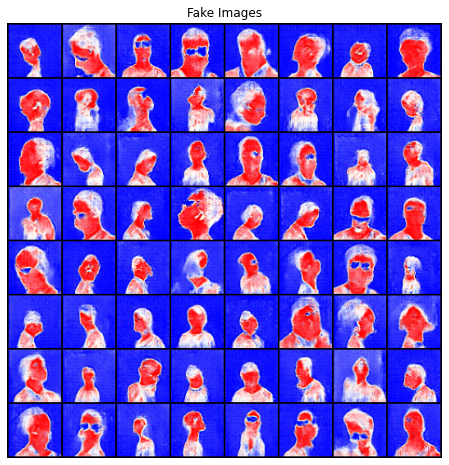

[126/250]	Loss_D: 0.5477	Loss_G: 2.5009	D(x): 0.7667	D(G(z)): 0.2029 / 0.1325 = 1.5320
[127/250]	Loss_D: 0.8278	Loss_G: 2.3609	D(x): 0.5963	D(G(z)): 0.0820 / 0.1583 = 0.5179
[128/250]	Loss_D: 1.0222	Loss_G: 6.5195	D(x): 0.9230	D(G(z)): 0.4313 / 0.0057 = 75.2617
[129/250]	Loss_D: 0.4073	Loss_G: 3.2421	D(x): 0.8035	D(G(z)): 0.1237 / 0.0687 = 1.8009
[130/250]	Loss_D: 0.0946	Loss_G: 5.9983	D(x): 0.9957	D(G(z)): 0.0801 / 0.0045 = 17.6978
[131/250]	Loss_D: 1.1451	Loss_G: 5.8561	D(x): 0.8797	D(G(z)): 0.4996 / 0.0122 = 40.9044
[132/250]	Loss_D: 1.3090	Loss_G: 1.9007	D(x): 0.4357	D(G(z)): 0.0285 / 0.2833 = 0.1005
[133/250]	Loss_D: 0.4635	Loss_G: 3.7467	D(x): 0.8588	D(G(z)): 0.2067 / 0.0504 = 4.1043
[134/250]	Loss_D: 1.2214	Loss_G: 1.3795	D(x): 0.4843	D(G(z)): 0.0524 / 0.3883 = 0.1351
[135/250]	Loss_D: 2.2420	Loss_G: 2.4813	D(x): 0.3317	D(G(z)): 0.0184 / 0.2336 = 0.0787
[136/250]	Loss_D: 0.2191	Loss_G: 4.5796	D(x): 0.9604	D(G(z)): 0.1248 / 0.0212 = 5.8901
[137/250]	Loss_D: 0.2518	Loss_G: 7.9835	

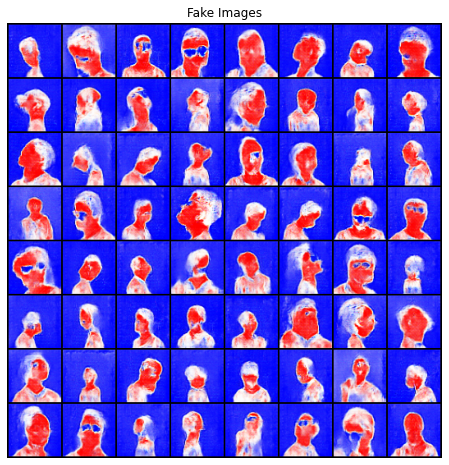

[139/250]	Loss_D: 0.1347	Loss_G: 4.8188	D(x): 0.9650	D(G(z)): 0.0784 / 0.0179 = 4.3714
[140/250]	Loss_D: 0.9205	Loss_G: 5.1347	D(x): 0.9287	D(G(z)): 0.4273 / 0.0158 = 27.1298
[141/250]	Loss_D: 0.1468	Loss_G: 4.8541	D(x): 0.9362	D(G(z)): 0.0555 / 0.0169 = 3.2752
[142/250]	Loss_D: 1.6184	Loss_G: 8.4359	D(x): 0.9640	D(G(z)): 0.6294 / 0.0015 = 413.9912
[143/250]	Loss_D: 0.9374	Loss_G: 2.8341	D(x): 0.6380	D(G(z)): 0.1039 / 0.1257 = 0.8268
[144/250]	Loss_D: 0.4867	Loss_G: 5.0881	D(x): 0.9249	D(G(z)): 0.2690 / 0.0164 = 16.4239
[145/250]	Loss_D: 0.6939	Loss_G: 2.9765	D(x): 0.7050	D(G(z)): 0.1246 / 0.1810 = 0.6888
[146/250]	Loss_D: 0.7398	Loss_G: 3.3631	D(x): 0.6037	D(G(z)): 0.0042 / 0.0778 = 0.0544
[147/250]	Loss_D: 0.2255	Loss_G: 5.2103	D(x): 0.8573	D(G(z)): 0.0066 / 0.0197 = 0.3360
[148/250]	Loss_D: 0.3702	Loss_G: 4.9378	D(x): 0.9420	D(G(z)): 0.1868 / 0.0213 = 8.7796
[149/250]	Loss_D: 1.1973	Loss_G: 10.6050	D(x): 0.9854	D(G(z)): 0.5223 / 0.0001 = 3852.6047
[150/250]	Loss_D: 0.2082	Loss_G: 5.

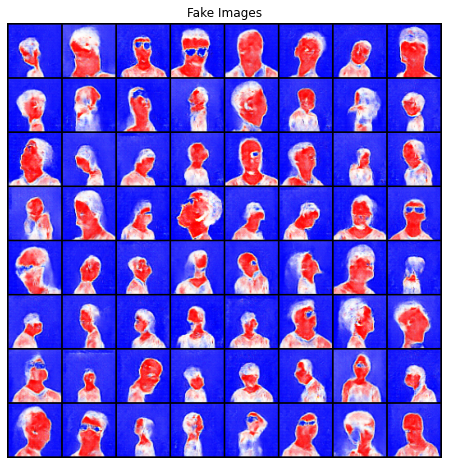

[153/250]	Loss_D: 0.7858	Loss_G: 7.4924	D(x): 0.9839	D(G(z)): 0.4329 / 0.0019 = 230.8435
[154/250]	Loss_D: 0.0521	Loss_G: 5.7853	D(x): 0.9645	D(G(z)): 0.0131 / 0.0062 = 2.1048
[155/250]	Loss_D: 0.3490	Loss_G: 3.9371	D(x): 0.8239	D(G(z)): 0.0991 / 0.0399 = 2.4877
[156/250]	Loss_D: 0.0458	Loss_G: 5.6586	D(x): 0.9791	D(G(z)): 0.0229 / 0.0077 = 2.9618
[157/250]	Loss_D: 0.2615	Loss_G: 9.3427	D(x): 0.9919	D(G(z)): 0.1868 / 0.0003 = 626.1651
[158/250]	Loss_D: 0.6871	Loss_G: 2.7973	D(x): 0.6508	D(G(z)): 0.0184 / 0.1293 = 0.1427
[159/250]	Loss_D: 0.1459	Loss_G: 5.7979	D(x): 0.9779	D(G(z)): 0.1042 / 0.0048 = 21.7151
[160/250]	Loss_D: 1.0286	Loss_G: 4.9991	D(x): 0.8245	D(G(z)): 0.3818 / 0.0603 = 6.3339
[161/250]	Loss_D: 0.2673	Loss_G: 4.0461	D(x): 0.8501	D(G(z)): 0.0710 / 0.0413 = 1.7216
[162/250]	Loss_D: 0.3287	Loss_G: 3.6839	D(x): 0.7855	D(G(z)): 0.0178 / 0.0691 = 0.2573
[163/250]	Loss_D: 0.7256	Loss_G: 7.1253	D(x): 0.9759	D(G(z)): 0.3699 / 0.0020 = 187.5126
[164/250]	Loss_D: 0.1398	Loss_G: 6.8

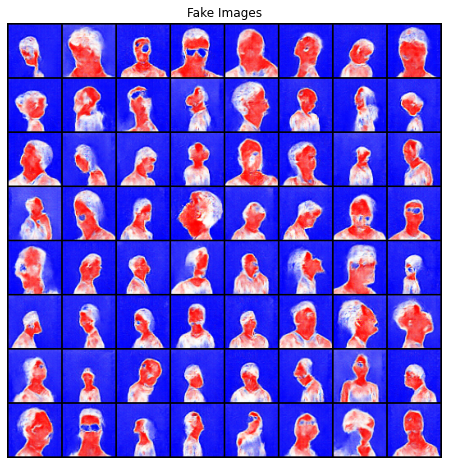

[167/250]	Loss_D: 0.4351	Loss_G: 3.5964	D(x): 0.7640	D(G(z)): 0.0822 / 0.0835 = 0.9847
[168/250]	Loss_D: 0.2179	Loss_G: 5.0265	D(x): 0.9151	D(G(z)): 0.0788 / 0.0213 = 3.6940
[169/250]	Loss_D: 0.1940	Loss_G: 4.1037	D(x): 0.8943	D(G(z)): 0.0586 / 0.0320 = 1.8295
[170/250]	Loss_D: 0.0584	Loss_G: 5.3856	D(x): 0.9871	D(G(z)): 0.0426 / 0.0080 = 5.3530
[171/250]	Loss_D: 0.1153	Loss_G: 5.2898	D(x): 0.9674	D(G(z)): 0.0652 / 0.0101 = 6.4820
[172/250]	Loss_D: 0.2606	Loss_G: 5.5621	D(x): 0.9667	D(G(z)): 0.1389 / 0.0095 = 14.6015
[173/250]	Loss_D: 0.0626	Loss_G: 6.8627	D(x): 0.9794	D(G(z)): 0.0344 / 0.0024 = 14.2654
[174/250]	Loss_D: 0.3619	Loss_G: 9.1624	D(x): 0.9769	D(G(z)): 0.2227 / 0.0007 = 299.6329
[175/250]	Loss_D: 0.1137	Loss_G: 6.5737	D(x): 0.9574	D(G(z)): 0.0525 / 0.0059 = 8.8443
[176/250]	Loss_D: 0.4397	Loss_G: 5.9953	D(x): 0.9606	D(G(z)): 0.2507 / 0.0048 = 52.6992
[177/250]	Loss_D: 0.1816	Loss_G: 4.8253	D(x): 0.8988	D(G(z)): 0.0223 / 0.0214 = 1.0438
[178/250]	Loss_D: 1.0342	Loss_G: 2.459

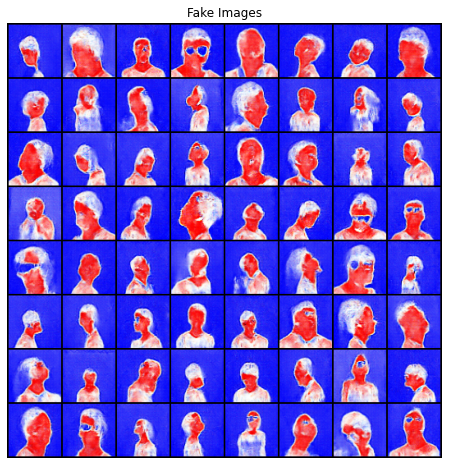

[181/250]	Loss_D: 0.1508	Loss_G: 6.5648	D(x): 0.9867	D(G(z)): 0.0923 / 0.0037 = 24.7889
[182/250]	Loss_D: 0.3080	Loss_G: 5.9438	D(x): 0.9583	D(G(z)): 0.1771 / 0.0066 = 26.9064
[183/250]	Loss_D: 0.0276	Loss_G: 6.5338	D(x): 0.9881	D(G(z)): 0.0147 / 0.0046 = 3.2051
[184/250]	Loss_D: 0.0173	Loss_G: 6.1914	D(x): 0.9942	D(G(z)): 0.0110 / 0.0063 = 1.7627
[185/250]	Loss_D: 0.0975	Loss_G: 5.8569	D(x): 0.9733	D(G(z)): 0.0588 / 0.0049 = 12.0217
[186/250]	Loss_D: 0.1418	Loss_G: 6.7540	D(x): 0.9798	D(G(z)): 0.0995 / 0.0032 = 31.3074
[187/250]	Loss_D: 1.8543	Loss_G: 2.0861	D(x): 0.3325	D(G(z)): 0.0004 / 0.3028 = 0.0013
[188/250]	Loss_D: 1.1936	Loss_G: 12.5026	D(x): 0.9930	D(G(z)): 0.5006 / 0.0001 = 6722.2190
[189/250]	Loss_D: 1.0724	Loss_G: 3.0028	D(x): 0.5011	D(G(z)): 0.0044 / 0.1486 = 0.0296
[190/250]	Loss_D: 0.0905	Loss_G: 5.1110	D(x): 0.9696	D(G(z)): 0.0477 / 0.0141 = 3.3717
[191/250]	Loss_D: 0.1720	Loss_G: 5.1829	D(x): 0.9474	D(G(z)): 0.0918 / 0.0175 = 5.2534
[192/250]	Loss_D: 0.1029	Loss_G: 5.

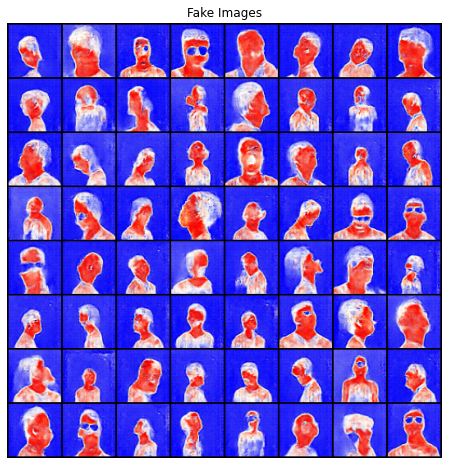

[195/250]	Loss_D: 0.5892	Loss_G: 8.3444	D(x): 0.9755	D(G(z)): 0.2599 / 0.0025 = 105.6066
[196/250]	Loss_D: 0.0506	Loss_G: 5.7105	D(x): 0.9762	D(G(z)): 0.0196 / 0.0103 = 1.9076
[197/250]	Loss_D: 0.0410	Loss_G: 5.8878	D(x): 0.9818	D(G(z)): 0.0212 / 0.0068 = 3.1354
[198/250]	Loss_D: 0.1404	Loss_G: 7.1125	D(x): 0.9928	D(G(z)): 0.1062 / 0.0019 = 57.3730
[199/250]	Loss_D: 0.1047	Loss_G: 7.4397	D(x): 0.9945	D(G(z)): 0.0809 / 0.0015 = 55.3237
[200/250]	Loss_D: 0.4913	Loss_G: 8.6592	D(x): 0.9768	D(G(z)): 0.2552 / 0.0041 = 62.5580
[201/250]	Loss_D: 0.0519	Loss_G: 6.2302	D(x): 0.9953	D(G(z)): 0.0429 / 0.0042 = 10.2775
[202/250]	Loss_D: 0.2041	Loss_G: 4.5796	D(x): 0.9025	D(G(z)): 0.0624 / 0.0322 = 1.9405
[203/250]	Loss_D: 0.4798	Loss_G: 7.1144	D(x): 0.9357	D(G(z)): 0.1624 / 0.0256 = 6.3354
[204/250]	Loss_D: 0.2853	Loss_G: 4.9630	D(x): 0.9211	D(G(z)): 0.1145 / 0.0199 = 5.7680
[205/250]	Loss_D: 0.0721	Loss_G: 6.0798	D(x): 0.9655	D(G(z)): 0.0261 / 0.0064 = 4.0518
[206/250]	Loss_D: 0.2623	Loss_G: 10.7

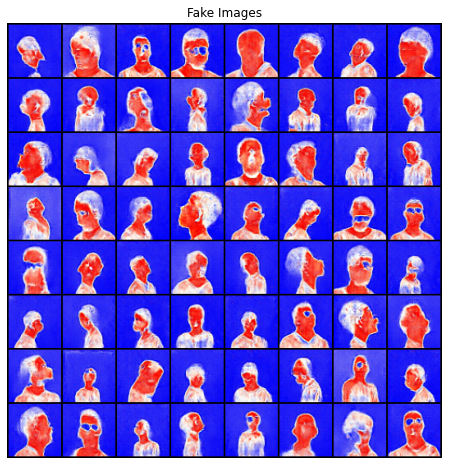

[209/250]	Loss_D: 0.0096	Loss_G: 7.5490	D(x): 0.9937	D(G(z)): 0.0031 / 0.0019 = 1.6969
[210/250]	Loss_D: 0.1100	Loss_G: 5.7142	D(x): 0.9374	D(G(z)): 0.0335 / 0.0139 = 2.4124
[211/250]	Loss_D: 0.9882	Loss_G: 11.1244	D(x): 0.9951	D(G(z)): 0.3820 / 0.0001 = 4110.1587
[212/250]	Loss_D: 0.1328	Loss_G: 5.5271	D(x): 0.9327	D(G(z)): 0.0427 / 0.0123 = 3.4594
[213/250]	Loss_D: 0.2316	Loss_G: 4.1712	D(x): 0.8350	D(G(z)): 0.0032 / 0.0610 = 0.0528
[214/250]	Loss_D: 0.0048	Loss_G: 8.0277	D(x): 0.9967	D(G(z)): 0.0014 / 0.0010 = 1.3932
[215/250]	Loss_D: 0.1513	Loss_G: 6.3394	D(x): 0.9524	D(G(z)): 0.0746 / 0.0060 = 12.4780
[216/250]	Loss_D: 0.1314	Loss_G: 6.5018	D(x): 0.9673	D(G(z)): 0.0804 / 0.0033 = 24.2606
[217/250]	Loss_D: 1.0020	Loss_G: 2.6597	D(x): 0.6095	D(G(z)): 0.0035 / 0.2322 = 0.0149
[218/250]	Loss_D: 0.1375	Loss_G: 5.2225	D(x): 0.8960	D(G(z)): 0.0129 / 0.0288 = 0.4487
[219/250]	Loss_D: 0.0148	Loss_G: 6.5766	D(x): 0.9949	D(G(z)): 0.0093 / 0.0053 = 1.7685
[220/250]	Loss_D: 0.1737	Loss_G: 5.85

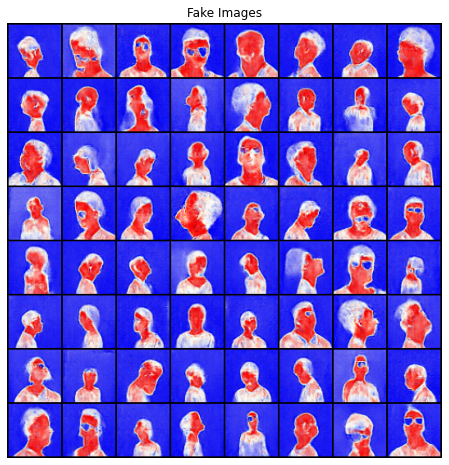

[223/250]	Loss_D: 0.1055	Loss_G: 4.8355	D(x): 0.9175	D(G(z)): 0.0116 / 0.0261 = 0.4460
[224/250]	Loss_D: 0.0674	Loss_G: 7.3394	D(x): 0.9989	D(G(z)): 0.0577 / 0.0018 = 32.9286
[225/250]	Loss_D: 0.2608	Loss_G: 7.4095	D(x): 0.9670	D(G(z)): 0.1256 / 0.0028 = 44.8766
[226/250]	Loss_D: 0.1212	Loss_G: 7.6936	D(x): 0.9965	D(G(z)): 0.0935 / 0.0011 = 83.3147
[227/250]	Loss_D: 0.0195	Loss_G: 7.2260	D(x): 0.9864	D(G(z)): 0.0053 / 0.0037 = 1.4503
[228/250]	Loss_D: 4.2887	Loss_G: 0.3668	D(x): 0.1583	D(G(z)): 0.0074 / 0.7784 = 0.0095
[229/250]	Loss_D: 0.4749	Loss_G: 3.6885	D(x): 0.8526	D(G(z)): 0.1423 / 0.0979 = 1.4541
[230/250]	Loss_D: 0.0944	Loss_G: 5.9511	D(x): 0.9680	D(G(z)): 0.0497 / 0.0112 = 4.4353
[231/250]	Loss_D: 0.5402	Loss_G: 4.9091	D(x): 0.7471	D(G(z)): 0.0203 / 0.0496 = 0.4099
[232/250]	Loss_D: 0.0610	Loss_G: 5.9010	D(x): 0.9598	D(G(z)): 0.0156 / 0.0065 = 2.4150
[233/250]	Loss_D: 0.0964	Loss_G: 9.0069	D(x): 0.9908	D(G(z)): 0.0702 / 0.0004 = 169.3293
[234/250]	Loss_D: 0.0733	Loss_G: 7.350

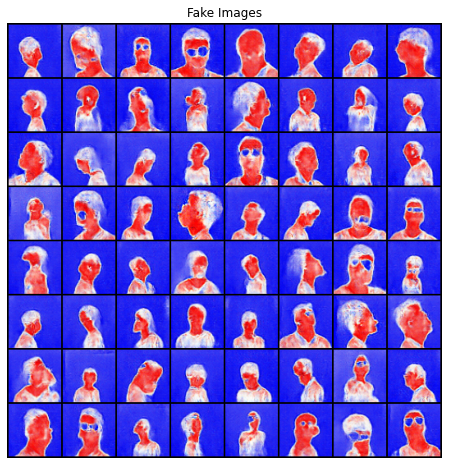

[237/250]	Loss_D: 0.0366	Loss_G: 6.8616	D(x): 0.9856	D(G(z)): 0.0181 / 0.0026 = 7.0654
[238/250]	Loss_D: 0.0336	Loss_G: 7.0393	D(x): 0.9964	D(G(z)): 0.0274 / 0.0016 = 17.1900
[239/250]	Loss_D: 0.0808	Loss_G: 6.5814	D(x): 0.9619	D(G(z)): 0.0326 / 0.0059 = 5.5647
[240/250]	Loss_D: 0.0300	Loss_G: 7.8735	D(x): 0.9844	D(G(z)): 0.0129 / 0.0018 = 7.0331
[241/250]	Loss_D: 0.1324	Loss_G: 5.0455	D(x): 0.9230	D(G(z)): 0.0294 / 0.0192 = 1.5279
[242/250]	Loss_D: 0.0875	Loss_G: 7.7250	D(x): 0.9893	D(G(z)): 0.0584 / 0.0025 = 23.5315
[243/250]	Loss_D: 0.1550	Loss_G: 7.2070	D(x): 0.9667	D(G(z)): 0.0944 / 0.0024 = 39.7272
[244/250]	Loss_D: 0.7007	Loss_G: 2.1942	D(x): 0.6444	D(G(z)): 0.0140 / 0.3286 = 0.0425
[245/250]	Loss_D: 0.0541	Loss_G: 6.7216	D(x): 0.9936	D(G(z)): 0.0414 / 0.0038 = 10.9729
[246/250]	Loss_D: 0.0118	Loss_G: 7.8321	D(x): 0.9925	D(G(z)): 0.0041 / 0.0023 = 1.8301
[247/250]	Loss_D: 0.0125	Loss_G: 6.9764	D(x): 0.9928	D(G(z)): 0.0052 / 0.0037 = 1.4072
[248/250]	Loss_D: 0.0128	Loss_G: 7.1235

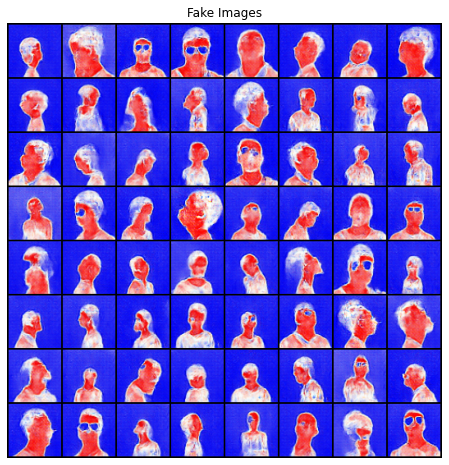

In [ ]:
# Training Loop
print("Starting Training Loop...")
# Iniciando o processo de Treinamento

for epoch in range(num_epochs):
    # Para cada batch do dataloader
    for i, data in enumerate(dataloader, 0):
        
        #Zerando os gradientes da rede D
        netD.zero_grad()
        real_cpu = data[0].to(device) #amostras de imagens  reais
        b_size = real_cpu.size(0) #calcular a quantidade de imagens
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device) #criar rotulos para as imagens reais (definida como 1)
        #aplicando a batch gerada no discriminador
        output = netD(real_cpu).view(-1) 
        #Calculando a loss na batch real com BCE
        errD_real = criterion(output, label)
        # backpropagation
        errD_real.backward()
        D_x = output.mean().item()

        ## Treinando com batch fake

        noise = torch.randn(b_size, z_dim, 1, 1, device=device)        # Gerando ruido
        fake = netG(noise) #Gerando imagens fakes com o Gerador
        label.fill_(fake_label) #criando rotulos para imagens fakes
        #classificando a saida com o discriminador
        output = netD(fake.detach()).view(-1)
        #Calculando a loss na batch real com BCE
        errD_fake = criterion(output, label)
        # backpropagation
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Somando os gradientes
        errD = errD_real + errD_fake
        # Atualizando os gradientes de D
        optimizerD.step()

        ############################
        # Atualizando a rede gerativa
        # Para evitar a saturacao de gradientes vamos atualizar a rede maximizando log(D(G(z)))
        ###########################

        #Zerando os gradientes da rede G
        netG.zero_grad()
        label.fill_(real_label)  # rotulos fakes sao reais para o gerador
        # Executar o discriminador
        output = netD(fake).view(-1)
        # Calculando a loss pela saida da rede
        errG = criterion(output, label)
        # Calculando os gradientes para o gerador
        errG.backward()
        D_G_z2 = output.mean().item()
        # Atualizando os parametros de G
        optimizerG.step()
        
        # status
        if i % 50 == 0:
            print('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f = %.4f'
                  % (epoch, num_epochs, errD.item(), errG.item(), D_x, D_G_z1, D_G_z2,D_G_z1/ D_G_z2))
        
        # Salvando as loss pra plotar depois????
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on noise_eval
        if (step % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(noise_eval).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
            # Plot the fake images from the last epoch
            plt.figure(figsize=(8,8))
            plt.axis("off")
            plt.title("Fake Images")
            plt.imshow(np.transpose(img_list[-1],(1,2,0)))
            plt.show()


            torch.save({
            'step': step,
            'modelG_state_dict': netG.state_dict(),
            'modelD_state_dict': netD.state_dict(),
            'optimizerG_state_dict': optimizerG.state_dict(),
            'optimizerD_state_dict': optimizerD.state_dict(),
            'G_losses': G_losses,
            'D_losses': D_losses, 
            'img_list': img_list,
            'noise_eval': noise_eval,           
            }, dataroot + "model.pt")

            
        step += 1


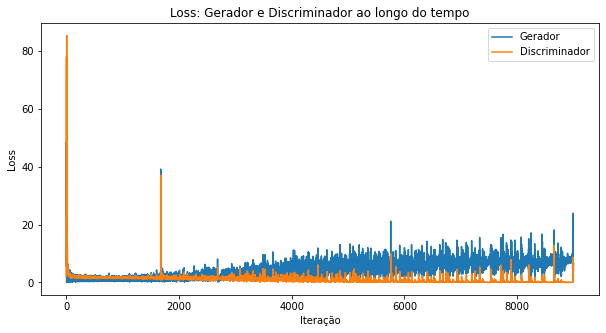

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Loss: Gerador e Discriminador ao longo do tempo")
plt.plot(G_losses,label="Gerador")
plt.plot(D_losses,label="Discriminador")
plt.xlabel("Iteração")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
step = 0

#Load Checkpoint
if os.path.exists(dataroot + "model.pt"):
  print('Loading model')
  checkpoint = torch.load(dataroot + "model.pt")
  netG.load_state_dict(checkpoint['modelG_state_dict'])
  netD.load_state_dict(checkpoint['modelD_state_dict'])
  optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
  optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
  step = checkpoint['step']
  G_losses = checkpoint['G_losses']
  D_losses = checkpoint['D_losses']
  img_list = checkpoint['img_list']
  noise_eval = checkpoint['noise_eval']

final = torch.randn(2200, z_dim, 1, 1, device=device)

with torch.no_grad():
    fake = netG(final).detach().cpu()

for count,el in enumerate(fake):
  print('gerando: ', 'resultados/dcgan_03/results_'+ str(count) +'.png')
  vutils.save_image(el,'resultados/dcgan_03/results_'+ str(count) +'.png',normalize=True)

print('fim')

Loading model
gerando:  resultados/dcgan_03/results_0.png
gerando:  resultados/dcgan_03/results_1.png
gerando:  resultados/dcgan_03/results_2.png
gerando:  resultados/dcgan_03/results_3.png
gerando:  resultados/dcgan_03/results_4.png
gerando:  resultados/dcgan_03/results_5.png
gerando:  resultados/dcgan_03/results_6.png
gerando:  resultados/dcgan_03/results_7.png
gerando:  resultados/dcgan_03/results_8.png
gerando:  resultados/dcgan_03/results_9.png
gerando:  resultados/dcgan_03/results_10.png
gerando:  resultados/dcgan_03/results_11.png
gerando:  resultados/dcgan_03/results_12.png
gerando:  resultados/dcgan_03/results_13.png
gerando:  resultados/dcgan_03/results_14.png
gerando:  resultados/dcgan_03/results_15.png
gerando:  resultados/dcgan_03/results_16.png
gerando:  resultados/dcgan_03/results_17.png
gerando:  resultados/dcgan_03/results_18.png
gerando:  resultados/dcgan_03/results_19.png
gerando:  resultados/dcgan_03/results_20.png
gerando:  resultados/dcgan_03/results_21.png
gerand

In [ ]:
!apt install imagemagick

In [ ]:
import matplotlib
import matplotlib.animation as animation
from IPython.display import HTML

final = 'paper_128_64_05'
matplotlib.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani.save(final+'.gif', writer='imagemagick', fps=30)
plt.savefig(final+'.png')

HTML(ani.to_jshtml())

In [ ]:
%ls resultados

In [ ]:
!nvidia-smi